# Lab3: Text Similarity with Quran (s437036583)

## Steps
 
1. Data Preprocessing.
1. TF-IDF Feature Generation.
1. Data Transformation.
1. K-Means Clustering.
1. Make Prediction.

### STEP 1: Data Preprocessing

In [0]:
# File location and type
file_location = "/FileStore/tables/quran.txt"
file_type = "text"

# CSV options
infer_schema = "false"
first_row_is_header = "false"
delimiter = ","

# The applied options are for CSV files. For other file types, these will be ignored.
df = spark.read.format(file_type) \
  .option("inferSchema", infer_schema) \
  .option("header", first_row_is_header) \
  .option("sep", delimiter) \
  .load(file_location)

display(df)

value
1|1|بِسْمِ اللَّهِ الرَّحْمَٰنِ الرَّحِيمِ
1|2|الْحَمْدُ لِلَّهِ رَبِّ الْعَالَمِينَ
1|3|الرَّحْمَٰنِ الرَّحِيمِ
1|4|مَالِكِ يَوْمِ الدِّينِ
1|5|إِيَّاكَ نَعْبُدُ وَإِيَّاكَ نَسْتَعِينُ
1|6|اهْدِنَا الصِّرَاطَ الْمُسْتَقِيمَ
1|7|صِرَاطَ الَّذِينَ أَنْعَمْتَ عَلَيْهِمْ غَيْرِ الْمَغْضُوبِ عَلَيْهِمْ وَلَا الضَّالِّينَ
2|1|بِسْمِ اللَّهِ الرَّحْمَٰنِ الرَّحِيمِ الم
2|2|ذَٰلِكَ الْكِتَابُ لَا رَيْبَ ۛ فِيهِ ۛ هُدًى لِلْمُتَّقِينَ
2|3|الَّذِينَ يُؤْمِنُونَ بِالْغَيْبِ وَيُقِيمُونَ الصَّلَاةَ وَمِمَّا رَزَقْنَاهُمْ يُنْفِقُونَ


In [0]:

split_col = pyspark.sql.functions.split(df['value'], '|')
aya = pyspark.sql.functions.regexp_replace(df['value'], "[0-9|]", " ")
df = df.withColumn('index', pyspark.sql.functions.monotonically_increasing_id())
df = df.withColumn('doc',  aya)

In [0]:
columns_to_drop = ['value']
df = df.drop(*columns_to_drop)

In [0]:
display(df)

index,doc
0,بِسْمِ اللَّهِ الرَّحْمَٰنِ الرَّحِيمِ
1,الْحَمْدُ لِلَّهِ رَبِّ الْعَالَمِينَ
2,الرَّحْمَٰنِ الرَّحِيمِ
3,مَالِكِ يَوْمِ الدِّينِ
4,إِيَّاكَ نَعْبُدُ وَإِيَّاكَ نَسْتَعِينُ
5,اهْدِنَا الصِّرَاطَ الْمُسْتَقِيمَ
6,صِرَاطَ الَّذِينَ أَنْعَمْتَ عَلَيْهِمْ غَيْرِ الْمَغْضُوبِ عَلَيْهِمْ وَلَا الضَّالِّينَ
7,بِسْمِ اللَّهِ الرَّحْمَٰنِ الرَّحِيمِ الم
8,ذَٰلِكَ الْكِتَابُ لَا رَيْبَ ۛ فِيهِ ۛ هُدًى لِلْمُتَّقِينَ
9,الَّذِينَ يُؤْمِنُونَ بِالْغَيْبِ وَيُقِيمُونَ الصَّلَاةَ وَمِمَّا رَزَقْنَاهُمْ يُنْفِقُونَ


In [0]:
data = df.collect()[0:6235]

In [0]:
data = spark.sparkContext.parallelize(data)
type(data)

Out[175]: pyspark.rdd.RDD

In [0]:
data = data.toDF()
type(data)
 

Out[176]: pyspark.sql.dataframe.DataFrame

### STEP 2: TF-IDF Feature Generation

In [0]:
from pyspark.ml.feature import HashingTF, IDF, Tokenizer


sentenceData = data
tokenizer = Tokenizer(inputCol="doc", outputCol="words")
wordsData = tokenizer.transform(sentenceData)

hashingTF = HashingTF(inputCol="words", outputCol="rawFeatures", numFeatures=20)
featurizedData = hashingTF.transform(wordsData)
# alternatively, CountVectorizer can also be used to get term frequency vectors

idf = IDF(inputCol="rawFeatures", outputCol="features")
idfModel = idf.fit(featurizedData)
rescaledData = idfModel.transform(featurizedData)

rescaledData.select("index",'doc', "features").show()

+-----+--------------------+--------------------+
|index|                 doc|            features|
+-----+--------------------+--------------------+
|    0|    بِسْمِ اللَّه...|(20,[0,2,6,12,16]...|
|    1|    الْحَمْدُ لِل...|(20,[0,4,5,12,16]...|
|    2|    الرَّحْمَٰنِ ...|(20,[2,6,12],[0.8...|
|    3|    مَالِكِ يَوْم...|(20,[0,2,12,14],[...|
|    4|    إِيَّاكَ نَعْ...|(20,[1,2,7,9,12],...|
|    5|    اهْدِنَا الصّ...|(20,[1,8,12,16],[...|
|    6|    صِرَاطَ الَّذ...|(20,[0,5,9,11,12,...|
|    7|    بِسْمِ اللَّه...|(20,[0,2,6,12,16]...|
|    8|    ذَٰلِكَ الْكِ...|(20,[4,5,7,8,10,1...|
|    9|    الَّذِينَ يُؤ...|(20,[3,10,11,12,1...|
|   10|    وَالَّذِينَ ي...|(20,[2,3,4,5,7,8,...|
|   11|    أُولَٰئِكَ عَ...|(20,[4,6,7,9,12,1...|
|   12|    إِنَّ الَّذِي...|(20,[4,7,8,9,10,1...|
|   13|    خَتَمَ اللَّه...|(20,[0,1,2,4,7,9,...|
|   14|    وَمِنَ النَّا...|(20,[2,4,7,8,11,1...|
|   15|    يُخَادِعُونَ ...|(20,[0,2,3,5,7,10...|
|   16|     فِي قُلُوبِه...|(20,[1,4,6,7,12,1...|


In [0]:
display(rescaledData)

index,doc,words,rawFeatures,features
0,بِسْمِ اللَّهِ الرَّحْمَٰنِ الرَّحِيمِ,"List(, , , , بِسْمِ, اللَّهِ, الرَّحْمَٰنِ, الرَّحِيمِ)","Map(vectorType -> sparse, length -> 20, indices -> List(0, 2, 6, 12, 16), values -> List(1.0, 1.0, 1.0, 4.0, 1.0))","Map(vectorType -> sparse, length -> 20, indices -> List(0, 2, 6, 12, 16), values -> List(0.645548966286368, 0.803580766295404, 0.8400545394130488, 0.0, 0.882549552262004))"
1,الْحَمْدُ لِلَّهِ رَبِّ الْعَالَمِينَ,"List(, , , , الْحَمْدُ, لِلَّهِ, رَبِّ, الْعَالَمِينَ)","Map(vectorType -> sparse, length -> 20, indices -> List(0, 4, 5, 12, 16), values -> List(1.0, 1.0, 1.0, 4.0, 1.0))","Map(vectorType -> sparse, length -> 20, indices -> List(0, 4, 5, 12, 16), values -> List(0.645548966286368, 0.6053877404844024, 0.8907223940178783, 0.0, 0.882549552262004))"
2,الرَّحْمَٰنِ الرَّحِيمِ,"List(, , , , الرَّحْمَٰنِ, الرَّحِيمِ)","Map(vectorType -> sparse, length -> 20, indices -> List(2, 6, 12), values -> List(1.0, 1.0, 4.0))","Map(vectorType -> sparse, length -> 20, indices -> List(2, 6, 12), values -> List(0.803580766295404, 0.8400545394130488, 0.0))"
3,مَالِكِ يَوْمِ الدِّينِ,"List(, , , , مَالِكِ, يَوْمِ, الدِّينِ)","Map(vectorType -> sparse, length -> 20, indices -> List(0, 2, 12, 14), values -> List(1.0, 1.0, 4.0, 1.0))","Map(vectorType -> sparse, length -> 20, indices -> List(0, 2, 12, 14), values -> List(0.645548966286368, 0.803580766295404, 0.0, 0.5781475745991198))"
4,إِيَّاكَ نَعْبُدُ وَإِيَّاكَ نَسْتَعِينُ,"List(, , , , إِيَّاكَ, نَعْبُدُ, وَإِيَّاكَ, نَسْتَعِينُ)","Map(vectorType -> sparse, length -> 20, indices -> List(1, 2, 7, 9, 12), values -> List(1.0, 1.0, 1.0, 1.0, 4.0))","Map(vectorType -> sparse, length -> 20, indices -> List(1, 2, 7, 9, 12), values -> List(1.0136475845441297, 0.803580766295404, 0.6312781912306148, 0.8887704121371065, 0.0))"
5,اهْدِنَا الصِّرَاطَ الْمُسْتَقِيمَ,"List(, , , , اهْدِنَا, الصِّرَاطَ, الْمُسْتَقِيمَ)","Map(vectorType -> sparse, length -> 20, indices -> List(1, 8, 12, 16), values -> List(1.0, 1.0, 4.0, 1.0))","Map(vectorType -> sparse, length -> 20, indices -> List(1, 8, 12, 16), values -> List(1.0136475845441297, 0.8404260794507613, 0.0, 0.882549552262004))"
6,صِرَاطَ الَّذِينَ أَنْعَمْتَ عَلَيْهِمْ غَيْرِ الْمَغْضُوبِ عَلَيْهِمْ وَلَا الضَّالِّينَ,"List(, , , , صِرَاطَ, الَّذِينَ, أَنْعَمْتَ, عَلَيْهِمْ, غَيْرِ, الْمَغْضُوبِ, عَلَيْهِمْ, وَلَا, الضَّالِّينَ)","Map(vectorType -> sparse, length -> 20, indices -> List(0, 5, 9, 11, 12, 16, 18, 19), values -> List(2.0, 1.0, 1.0, 1.0, 4.0, 1.0, 2.0, 1.0))","Map(vectorType -> sparse, length -> 20, indices -> List(0, 5, 9, 11, 12, 16, 18, 19), values -> List(1.291097932572736, 0.8907223940178783, 0.8887704121371065, 1.0391580303642194, 0.0, 0.882549552262004, 1.933210940120102, 0.9725251490803509))"
7,بِسْمِ اللَّهِ الرَّحْمَٰنِ الرَّحِيمِ الم,"List(, , , , بِسْمِ, اللَّهِ, الرَّحْمَٰنِ, الرَّحِيمِ, الم)","Map(vectorType -> sparse, length -> 20, indices -> List(0, 2, 6, 12, 16), values -> List(1.0, 1.0, 1.0, 5.0, 1.0))","Map(vectorType -> sparse, length -> 20, indices -> List(0, 2, 6, 12, 16), values -> List(0.645548966286368, 0.803580766295404, 0.8400545394130488, 0.0, 0.882549552262004))"
8,ذَٰلِكَ الْكِتَابُ لَا رَيْبَ ۛ فِيهِ ۛ هُدًى لِلْمُتَّقِينَ,"List(, , , , ذَٰلِكَ, الْكِتَابُ, لَا, رَيْبَ, ۛ, فِيهِ, ۛ, هُدًى, لِلْمُتَّقِينَ)","Map(vectorType -> sparse, length -> 20, indices -> List(4, 5, 7, 8, 10, 11, 12, 16), values -> List(2.0, 1.0, 1.0, 2.0, 1.0, 1.0, 4.0, 1.0))","Map(vectorType -> sparse, length -> 20, indices -> List(4, 5, 7, 8, 10, 11, 12, 16), values -> List(1.2107754809688047, 0.8907223940178783, 0.6312781912306148, 1.6808521589015226, 0.8868222330677836, 1.0391580303642194, 0.0, 0.882549552262004))"
9,الَّذِينَ يُؤْمِنُونَ بِالْغَيْبِ وَيُقِيمُونَ الصَّلَاةَ وَمِمَّا رَزَقْنَاهُمْ يُنْفِقُونَ,"List(, , , , الَّذِينَ, يُؤْمِنُونَ, بِالْغَيْبِ, وَيُقِيمُونَ, الصَّلَاةَ, وَمِمَّا, رَزَقْنَاهُمْ, يُنْفِقُونَ)","Map(vectorType -> sparse, length -> 20, indices -> List(3, 10, 11, 1

### STEP 3: Data Transformation

In [0]:
from pyspark.ml.feature import StandardScaler
scale=StandardScaler(inputCol='features',outputCol='standardized')
data_scale=scale.fit(rescaledData)
data_scale_output=data_scale.transform(rescaledData)
data_scale_output.show(2)

+-----+--------------------+--------------------+--------------------+--------------------+--------------------+
|index|                 doc|               words|         rawFeatures|            features|        standardized|
+-----+--------------------+--------------------+--------------------+--------------------+--------------------+
|    0|    بِسْمِ اللَّه...|[, , , , بِسْمِ, ...|(20,[0,2,6,12,16]...|(20,[0,2,6,12,16]...|(20,[0,2,6,12,16]...|
|    1|    الْحَمْدُ لِل...|[, , , , الْحَمْد...|(20,[0,4,5,12,16]...|(20,[0,4,5,12,16]...|(20,[0,4,5,12,16]...|
+-----+--------------------+--------------------+--------------------+--------------------+--------------------+
only showing top 2 rows



In [0]:
display(data_scale_output)

index,doc,words,rawFeatures,features,standardized
0,بِسْمِ اللَّهِ الرَّحْمَٰنِ الرَّحِيمِ,"List(, , , , بِسْمِ, اللَّهِ, الرَّحْمَٰنِ, الرَّحِيمِ)","Map(vectorType -> sparse, length -> 20, indices -> List(0, 2, 6, 12, 16), values -> List(1.0, 1.0, 1.0, 4.0, 1.0))","Map(vectorType -> sparse, length -> 20, indices -> List(0, 2, 6, 12, 16), values -> List(0.645548966286368, 0.803580766295404, 0.8400545394130488, 0.0, 0.882549552262004))","Map(vectorType -> sparse, length -> 20, indices -> List(0, 2, 6, 12, 16), values -> List(0.8607090631715877, 1.061107084937997, 1.100725101710509, 0.0, 1.1266639091069093))"
1,الْحَمْدُ لِلَّهِ رَبِّ الْعَالَمِينَ,"List(, , , , الْحَمْدُ, لِلَّهِ, رَبِّ, الْعَالَمِينَ)","Map(vectorType -> sparse, length -> 20, indices -> List(0, 4, 5, 12, 16), values -> List(1.0, 1.0, 1.0, 4.0, 1.0))","Map(vectorType -> sparse, length -> 20, indices -> List(0, 4, 5, 12, 16), values -> List(0.645548966286368, 0.6053877404844024, 0.8907223940178783, 0.0, 0.882549552262004))","Map(vectorType -> sparse, length -> 20, indices -> List(0, 4, 5, 12, 16), values -> List(0.8607090631715877, 0.704534457983049, 1.1038091927687257, 0.0, 1.1266639091069093))"
2,الرَّحْمَٰنِ الرَّحِيمِ,"List(, , , , الرَّحْمَٰنِ, الرَّحِيمِ)","Map(vectorType -> sparse, length -> 20, indices -> List(2, 6, 12), values -> List(1.0, 1.0, 4.0))","Map(vectorType -> sparse, length -> 20, indices -> List(2, 6, 12), values -> List(0.803580766295404, 0.8400545394130488, 0.0))","Map(vectorType -> sparse, length -> 20, indices -> List(2, 6, 12), values -> List(1.061107084937997, 1.100725101710509, 0.0))"
3,مَالِكِ يَوْمِ الدِّينِ,"List(, , , , مَالِكِ, يَوْمِ, الدِّينِ)","Map(vectorType -> sparse, length -> 20, indices -> List(0, 2, 12, 14), values -> List(1.0, 1.0, 4.0, 1.0))","Map(vectorType -> sparse, length -> 20, indices -> List(0, 2, 12, 14), values -> List(0.645548966286368, 0.803580766295404, 0.0, 0.5781475745991198))","Map(vectorType -> sparse, length -> 20, indices -> List(0, 2, 12, 14), values -> List(0.8607090631715877, 1.061107084937997, 0.0, 0.7534821261077205))"
4,إِيَّاكَ نَعْبُدُ وَإِيَّاكَ نَسْتَعِينُ,"List(, , , , إِيَّاكَ, نَعْبُدُ, وَإِيَّاكَ, نَسْتَعِينُ)","Map(vectorType -> sparse, length -> 20, indices -> List(1, 2, 7, 9, 12), values -> List(1.0, 1.0, 1.0, 1.0, 4.0))","Map(vectorType -> sparse, length -> 20, indices -> List(1, 2, 7, 9, 12), values -> List(1.0136475845441297, 0.803580766295404, 0.6312781912306148, 0.8887704121371065, 0.0))","Map(vectorType -> sparse, length -> 20, indices -> List(1, 2, 7, 9, 12), values -> List(1.224395406670009, 1.061107084937997, 0.7216561428381215, 1.1205984450418516, 0.0))"
5,اهْدِنَا الصِّرَاطَ الْمُسْتَقِيمَ,"List(, , , , اهْدِنَا, الصِّرَاطَ, الْمُسْتَقِيمَ)","Map(vectorType -> sparse, length -> 20, indices -> List(1, 8, 12, 16), values -> List(1.0, 1.0, 4.0, 1.0))","Map(vectorType -> sparse, length -> 20, indices -> List(1, 8, 12, 16), values -> List(1.0136475845441297, 0.8404260794507613, 0.0, 0.882549552262004))","Map(vectorType -> sparse, length -> 20, indices -> List(1, 8, 12, 16), values -> List(1.224395406670009, 1.1330624385017485, 0.0, 1.1266639091069093))"
6,صِرَاطَ الَّذِينَ أَنْعَمْتَ عَلَيْهِمْ غَيْرِ الْمَغْضُوبِ عَلَيْهِمْ وَلَا الضَّالِّينَ,"List(, , , , صِرَاطَ, الَّذِينَ, أَنْعَمْتَ, عَلَيْهِمْ, غَيْرِ, الْمَغْضُوبِ, عَلَيْهِمْ, وَلَا, الضَّالِّينَ)","Map(vectorType -> sparse, length -> 20, indices -> List(0, 5, 9, 11, 12, 16, 18, 19), values -> List(2.0, 1.0, 1.0, 1.0, 4.0, 1.0, 2.0, 1.0))","Map(vectorType -> sparse, length -> 20, indices -> List(0, 5, 9, 11, 12, 16, 18, 19), values -> List(1.291097932572736, 0.8907223940178783, 0.8887704121371065, 1.0391580303642194, 0.0, 0.882549552262004, 1.933210940120102, 0.9725251490803509))","Map(vectorType -> sparse, length -> 20, indices -> List(0, 5, 9, 11, 12, 16, 18, 19), values -> List(1.7214181263431754, 1.1038091927687257, 1.1205984450418516, 1.2896394611089437, 0.0, 1.1266639091069093, 2.4295431238376604, 1.2183239558502477

### STEP 4: K-Means Clustering

In [0]:
from pyspark.ml.clustering import KMeans
from pyspark.ml.evaluation import ClusteringEvaluator
silhouette_score=[]
evaluator = ClusteringEvaluator(predictionCol='prediction', featuresCol='standardized', \
                                metricName='silhouette', distanceMeasure='squaredEuclidean')
for i in range(2,10):
    
    KMeans_algo=KMeans(featuresCol='standardized', k=i)
    
    KMeans_fit=KMeans_algo.fit(data_scale_output)
    
    output=KMeans_fit.transform(data_scale_output)
    
    
    
    score=evaluator.evaluate(output)
    
    silhouette_score.append(score)
    
    print("Silhouette Score for k= "+str(i)+" : "+str(score))

Silhouette Score for k= 2 : 0.49026492571849534
Silhouette Score for k= 3 : 0.2948549942692029
Silhouette Score for k= 4 : 0.17166729297094152
Silhouette Score for k= 5 : 0.1659290040607859
Silhouette Score for k= 6 : 0.1537318880497749
Silhouette Score for k= 7 : 0.16463880729348063
Silhouette Score for k= 8 : 0.11438580171125662
Silhouette Score for k= 9 : 0.05476449003406423


Out[182]: Text(0, 0.5, 'cost')

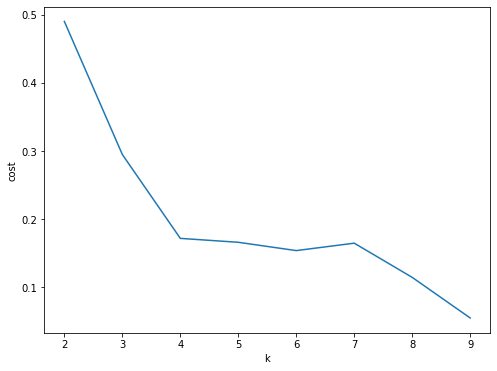

In [0]:
#Visualizing the silhouette scores in a plot
import matplotlib.pyplot as plt
fig, ax = plt.subplots(1,1, figsize =(8,6))
ax.plot(range(2,10),silhouette_score)
ax.set_xlabel('k')
ax.set_ylabel('cost')

In [0]:
display(output)

index,doc,words,rawFeatures,features,standardized,prediction
0,بِسْمِ اللَّهِ الرَّحْمَٰنِ الرَّحِيمِ,"List(, , , , بِسْمِ, اللَّهِ, الرَّحْمَٰنِ, الرَّحِيمِ)","Map(vectorType -> sparse, length -> 20, indices -> List(0, 2, 6, 12, 16), values -> List(1.0, 1.0, 1.0, 4.0, 1.0))","Map(vectorType -> sparse, length -> 20, indices -> List(0, 2, 6, 12, 16), values -> List(0.645548966286368, 0.803580766295404, 0.8400545394130488, 0.0, 0.882549552262004))","Map(vectorType -> sparse, length -> 20, indices -> List(0, 2, 6, 12, 16), values -> List(0.8607090631715877, 1.061107084937997, 1.100725101710509, 0.0, 1.1266639091069093))",0
1,الْحَمْدُ لِلَّهِ رَبِّ الْعَالَمِينَ,"List(, , , , الْحَمْدُ, لِلَّهِ, رَبِّ, الْعَالَمِينَ)","Map(vectorType -> sparse, length -> 20, indices -> List(0, 4, 5, 12, 16), values -> List(1.0, 1.0, 1.0, 4.0, 1.0))","Map(vectorType -> sparse, length -> 20, indices -> List(0, 4, 5, 12, 16), values -> List(0.645548966286368, 0.6053877404844024, 0.8907223940178783, 0.0, 0.882549552262004))","Map(vectorType -> sparse, length -> 20, indices -> List(0, 4, 5, 12, 16), values -> List(0.8607090631715877, 0.704534457983049, 1.1038091927687257, 0.0, 1.1266639091069093))",0
2,الرَّحْمَٰنِ الرَّحِيمِ,"List(, , , , الرَّحْمَٰنِ, الرَّحِيمِ)","Map(vectorType -> sparse, length -> 20, indices -> List(2, 6, 12), values -> List(1.0, 1.0, 4.0))","Map(vectorType -> sparse, length -> 20, indices -> List(2, 6, 12), values -> List(0.803580766295404, 0.8400545394130488, 0.0))","Map(vectorType -> sparse, length -> 20, indices -> List(2, 6, 12), values -> List(1.061107084937997, 1.100725101710509, 0.0))",0
3,مَالِكِ يَوْمِ الدِّينِ,"List(, , , , مَالِكِ, يَوْمِ, الدِّينِ)","Map(vectorType -> sparse, length -> 20, indices -> List(0, 2, 12, 14), values -> List(1.0, 1.0, 4.0, 1.0))","Map(vectorType -> sparse, length -> 20, indices -> List(0, 2, 12, 14), values -> List(0.645548966286368, 0.803580766295404, 0.0, 0.5781475745991198))","Map(vectorType -> sparse, length -> 20, indices -> List(0, 2, 12, 14), values -> List(0.8607090631715877, 1.061107084937997, 0.0, 0.7534821261077205))",0
4,إِيَّاكَ نَعْبُدُ وَإِيَّاكَ نَسْتَعِينُ,"List(, , , , إِيَّاكَ, نَعْبُدُ, وَإِيَّاكَ, نَسْتَعِينُ)","Map(vectorType -> sparse, length -> 20, indices -> List(1, 2, 7, 9, 12), values -> List(1.0, 1.0, 1.0, 1.0, 4.0))","Map(vectorType -> sparse, length -> 20, indices -> List(1, 2, 7, 9, 12), values -> List(1.0136475845441297, 0.803580766295404, 0.6312781912306148, 0.8887704121371065, 0.0))","Map(vectorType -> sparse, length -> 20, indices -> List(1, 2, 7, 9, 12), values -> List(1.224395406670009, 1.061107084937997, 0.7216561428381215, 1.1205984450418516, 0.0))",0
5,اهْدِنَا الصِّرَاطَ الْمُسْتَقِيمَ,"List(, , , , اهْدِنَا, الصِّرَاطَ, الْمُسْتَقِيمَ)","Map(vectorType -> sparse, length -> 20, indices -> List(1, 8, 12, 16), values -> List(1.0, 1.0, 4.0, 1.0))","Map(vectorType -> sparse, length -> 20, indices -> List(1, 8, 12, 16), values -> List(1.0136475845441297, 0.8404260794507613, 0.0, 0.882549552262004))","Map(vectorType -> sparse, length -> 20, indices -> List(1, 8, 12, 16), values -> List(1.224395406670009, 1.1330624385017485, 0.0, 1.1266639091069093))",0
6,صِرَاطَ الَّذِينَ أَنْعَمْتَ عَلَيْهِمْ غَيْرِ الْمَغْضُوبِ عَلَيْهِمْ وَلَا الضَّالِّينَ,"List(, , , , صِرَاطَ, الَّذِينَ, أَنْعَمْتَ, عَلَيْهِمْ, غَيْرِ, الْمَغْضُوبِ, عَلَيْهِمْ, وَلَا, الضَّالِّينَ)","Map(vectorType -> sparse, length -> 20, indices -> List(0, 5, 9, 11, 12, 16, 18, 19), values -> List(2.0, 1.0, 1.0, 1.0, 4.0, 1.0, 2.0, 1.0))","Map(vectorType -> sparse, length -> 20, indices -> List(0, 5, 9, 11, 12, 16, 18, 19), values -> List(1.291097932572736, 0.8907223940178783, 0.8887704121371065, 1.0391580303642194, 0.0, 0.882549552262004, 1.933210940120102, 0.9725251490803509))","Map(vectorType -> sparse, length -> 20, indices -> List(0, 5, 9, 11, 12, 16, 18, 19), values -> List(1.7214181263431754, 1.1038091927687257, 1.1205984450418516, 1.2896394611089437, 0.0, 1.1266639091069093, 2.4295431238376

### STEP 5: Make Prediction

In [0]:
KMeans_algo=KMeans(featuresCol='standardized', k=7)
    
KMeans_fit=KMeans_algo.fit(data_scale_output)
    
output=KMeans_fit.transform(data_scale_output)

In [0]:
display(output)

index,doc,words,rawFeatures,features,standardized,prediction
0,بِسْمِ اللَّهِ الرَّحْمَٰنِ الرَّحِيمِ,"List(, , , , بِسْمِ, اللَّهِ, الرَّحْمَٰنِ, الرَّحِيمِ)","Map(vectorType -> sparse, length -> 20, indices -> List(0, 2, 6, 12, 16), values -> List(1.0, 1.0, 1.0, 4.0, 1.0))","Map(vectorType -> sparse, length -> 20, indices -> List(0, 2, 6, 12, 16), values -> List(0.645548966286368, 0.803580766295404, 0.8400545394130488, 0.0, 0.882549552262004))","Map(vectorType -> sparse, length -> 20, indices -> List(0, 2, 6, 12, 16), values -> List(0.8607090631715877, 1.061107084937997, 1.100725101710509, 0.0, 1.1266639091069093))",0
1,الْحَمْدُ لِلَّهِ رَبِّ الْعَالَمِينَ,"List(, , , , الْحَمْدُ, لِلَّهِ, رَبِّ, الْعَالَمِينَ)","Map(vectorType -> sparse, length -> 20, indices -> List(0, 4, 5, 12, 16), values -> List(1.0, 1.0, 1.0, 4.0, 1.0))","Map(vectorType -> sparse, length -> 20, indices -> List(0, 4, 5, 12, 16), values -> List(0.645548966286368, 0.6053877404844024, 0.8907223940178783, 0.0, 0.882549552262004))","Map(vectorType -> sparse, length -> 20, indices -> List(0, 4, 5, 12, 16), values -> List(0.8607090631715877, 0.704534457983049, 1.1038091927687257, 0.0, 1.1266639091069093))",0
2,الرَّحْمَٰنِ الرَّحِيمِ,"List(, , , , الرَّحْمَٰنِ, الرَّحِيمِ)","Map(vectorType -> sparse, length -> 20, indices -> List(2, 6, 12), values -> List(1.0, 1.0, 4.0))","Map(vectorType -> sparse, length -> 20, indices -> List(2, 6, 12), values -> List(0.803580766295404, 0.8400545394130488, 0.0))","Map(vectorType -> sparse, length -> 20, indices -> List(2, 6, 12), values -> List(1.061107084937997, 1.100725101710509, 0.0))",0
3,مَالِكِ يَوْمِ الدِّينِ,"List(, , , , مَالِكِ, يَوْمِ, الدِّينِ)","Map(vectorType -> sparse, length -> 20, indices -> List(0, 2, 12, 14), values -> List(1.0, 1.0, 4.0, 1.0))","Map(vectorType -> sparse, length -> 20, indices -> List(0, 2, 12, 14), values -> List(0.645548966286368, 0.803580766295404, 0.0, 0.5781475745991198))","Map(vectorType -> sparse, length -> 20, indices -> List(0, 2, 12, 14), values -> List(0.8607090631715877, 1.061107084937997, 0.0, 0.7534821261077205))",0
4,إِيَّاكَ نَعْبُدُ وَإِيَّاكَ نَسْتَعِينُ,"List(, , , , إِيَّاكَ, نَعْبُدُ, وَإِيَّاكَ, نَسْتَعِينُ)","Map(vectorType -> sparse, length -> 20, indices -> List(1, 2, 7, 9, 12), values -> List(1.0, 1.0, 1.0, 1.0, 4.0))","Map(vectorType -> sparse, length -> 20, indices -> List(1, 2, 7, 9, 12), values -> List(1.0136475845441297, 0.803580766295404, 0.6312781912306148, 0.8887704121371065, 0.0))","Map(vectorType -> sparse, length -> 20, indices -> List(1, 2, 7, 9, 12), values -> List(1.224395406670009, 1.061107084937997, 0.7216561428381215, 1.1205984450418516, 0.0))",0
5,اهْدِنَا الصِّرَاطَ الْمُسْتَقِيمَ,"List(, , , , اهْدِنَا, الصِّرَاطَ, الْمُسْتَقِيمَ)","Map(vectorType -> sparse, length -> 20, indices -> List(1, 8, 12, 16), values -> List(1.0, 1.0, 4.0, 1.0))","Map(vectorType -> sparse, length -> 20, indices -> List(1, 8, 12, 16), values -> List(1.0136475845441297, 0.8404260794507613, 0.0, 0.882549552262004))","Map(vectorType -> sparse, length -> 20, indices -> List(1, 8, 12, 16), values -> List(1.224395406670009, 1.1330624385017485, 0.0, 1.1266639091069093))",0
6,صِرَاطَ الَّذِينَ أَنْعَمْتَ عَلَيْهِمْ غَيْرِ الْمَغْضُوبِ عَلَيْهِمْ وَلَا الضَّالِّينَ,"List(, , , , صِرَاطَ, الَّذِينَ, أَنْعَمْتَ, عَلَيْهِمْ, غَيْرِ, الْمَغْضُوبِ, عَلَيْهِمْ, وَلَا, الضَّالِّينَ)","Map(vectorType -> sparse, length -> 20, indices -> List(0, 5, 9, 11, 12, 16, 18, 19), values -> List(2.0, 1.0, 1.0, 1.0, 4.0, 1.0, 2.0, 1.0))","Map(vectorType -> sparse, length -> 20, indices -> List(0, 5, 9, 11, 12, 16, 18, 19), values -> List(1.291097932572736, 0.8907223940178783, 0.8887704121371065, 1.0391580303642194, 0.0, 0.882549552262004, 1.933210940120102, 0.9725251490803509))","Map(vectorType -> sparse, length -> 20, indices -> List(0, 5, 9, 11, 12, 16, 18, 19), values -> List(1.7214181263431754, 1.1038091927687257, 1.1205984450418516, 1.2896394611089437, 0.0, 1.1266639091069093, 2.4295431238376

In [0]:
display(output.select("doc","prediction").show())

+--------------------+----------+
|                 doc|prediction|
+--------------------+----------+
|    بِسْمِ اللَّه...|         0|
|    الْحَمْدُ لِل...|         0|
|    الرَّحْمَٰنِ ...|         0|
|    مَالِكِ يَوْم...|         0|
|    إِيَّاكَ نَعْ...|         0|
|    اهْدِنَا الصّ...|         0|
|    صِرَاطَ الَّذ...|         0|
|    بِسْمِ اللَّه...|         0|
|    ذَٰلِكَ الْكِ...|         0|
|    الَّذِينَ يُؤ...|         0|
|    وَالَّذِينَ ي...|         4|
|    أُولَٰئِكَ عَ...|         0|
|    إِنَّ الَّذِي...|         3|
|    خَتَمَ اللَّه...|         2|
|    وَمِنَ النَّا...|         0|
|    يُخَادِعُونَ ...|         0|
|     فِي قُلُوبِه...|         4|
|     وَإِذَا قِيل...|         4|
|     أَلَا إِنَّه...|         0|
|     وَإِذَا قِيل...|         4|
+--------------------+----------+
only showing top 20 rows



In [0]:
import pyspark.sql.functions as f


In [0]:
output.groupby("prediction").count().show()

+----------+-----+
|prediction|count|
+----------+-----+
|         1|  523|
|         6|  126|
|         3|  783|
|         5|  441|
|         4| 1222|
|         2|  375|
|         0| 2765|
+----------+-----+



In [0]:
similarities = output.groupby("prediction").agg(f.concat_ws(", ", f.collect_list(output.doc))).withColumnRenamed("concat_ws(, , collect_list(doc))", "similarities")
display(similarities)

prediction similarities 1 يَكَادُ الْبَرْقُ يَخْطَفُ أَبْصَارَهُمْ ۖ كُلَّمَا أَضَاءَ لَهُمْ مَشَوْا فِيهِ وَإِذَا أَظْلَمَ عَلَيْهِمْ قَامُوا ۚ وَلَوْ شَاءَ اللَّهُ لَذَهَبَ بِسَمْعِهِمْ وَأَبْصَارِهِمْ ۚ إِنَّ اللَّهَ عَلَىٰ كُلِّ شَيْءٍ قَدِيرٌ, وَبَشِّرِ الَّذِينَ آمَنُوا وَعَمِلُوا الصَّالِحَاتِ أَنَّ لَهُمْ جَنَّاتٍ تَجْرِي مِنْ تَحْتِهَا الْأَنْهَارُ ۖ كُلَّمَا رُزِقُوا مِنْهَا مِنْ ثَمَرَةٍ رِزْقًا ۙ قَالُوا هَٰذَا الَّذِي رُزِقْنَا مِنْ قَبْلُ ۖ وَأُتُوا بِهِ مُتَشَابِهًا ۖ وَلَهُمْ فِيهَا أَزْوَاجٌ مُطَهَّرَةٌ ۖ وَهُمْ فِيهَا خَالِدُونَ, وَإِذْ قَالَ رَبُّكَ لِلْمَلَائِكَةِ إِنِّي جَاعِلٌ فِي الْأَرْضِ خَلِيفَةً ۖ قَالُوا أَتَجْعَلُ فِيهَا مَنْ يُفْسِدُ فِيهَا وَيَسْفِكُ الدِّمَاءَ وَنَحْنُ نُسَبِّحُ بِحَمْدِكَ وَنُقَدِّسُ لَكَ ۖ قَالَ إِنِّي أَعْلَمُ مَا لَا تَعْلَمُونَ, ۞ وَإِذِ اسْتَسْقَىٰ مُوسَىٰ لِقَوْمِهِ فَقُلْنَا اضْرِبْ بِعَصَاكَ الْحَجَرَ ۖ فَانْفَجَرَتْ مِنْهُ اثْنَتَا عَشْرَةَ عَيْنًا ۖ قَدْ عَلِمَ كُلُّ أُنَاسٍ مَشْرَبَهُمْ ۖ كُلُوا وَاشْرَبُوا مِنْ رِزْقِ اللَّهِ وَلَا تَعْثَوْا فِي الْأَرْضِ مُفْسِدِينَ, إِنَّ الَّذِينَ آمَنُوا وَالَّذِينَ هَادُوا وَالنَّصَارَىٰ وَالصَّابِئِينَ مَنْ آمَنَ بِاللَّهِ وَالْيَوْمِ الْآخِرِ وَعَمِلَ صَالِحًا فَلَهُمْ أَجْرُهُمْ عِنْدَ رَبِّهِمْ وَلَا خَوْفٌ عَلَيْهِمْ وَلَا هُمْ يَحْزَنُونَ, وَإِذْ قَالَ مُوسَىٰ لِقَوْمِهِ إِنَّ اللَّهَ يَأْمُرُكُمْ أَنْ تَذْبَحُوا بَقَرَةً ۖ قَالُوا أَتَتَّخِذُنَا هُزُوًا ۖ قَالَ أَعُوذُ بِاللَّهِ أَنْ أَكُونَ مِنَ الْجَاهِلِينَ, قَالَ إِنَّهُ يَقُولُ إِنَّهَا بَقَرَةٌ لَا ذَلُولٌ تُثِيرُ الْأَرْضَ وَلَا تَسْقِي الْحَرْثَ مُسَلَّمَةٌ لَا شِيَةَ فِيهَا ۚ قَالُوا الْآنَ جِئْتَ بِالْحَقِّ ۚ فَذَبَحُوهَا وَمَا كَادُوا يَفْعَلُونَ, وَإِذَا لَقُوا الَّذِينَ آمَنُوا قَالُوا آمَنَّا وَإِذَا خَلَا بَعْضُهُمْ إِلَىٰ بَعْضٍ قَالُوا أَتُحَدِّثُونَهُمْ بِمَا فَتَحَ اللَّهُ عَلَيْكُمْ لِيُحَاجُّوكُمْ بِهِ عِنْدَ رَبِّكُمْ ۚ أَفَلَا تَعْقِلُونَ, وَقَالُوا لَنْ تَمَسَّنَا النَّارُ إِلَّا أَيَّامًا مَعْدُودَةً ۚ قُلْ أَتَّخَذْتُمْ عِنْدَ اللَّهِ عَهْدًا فَلَنْ يُخْلِفَ اللَّهُ عَهْدَهُ ۖ أَمْ تَقُولُونَ عَلَى اللَّهِ مَا لَا تَعْلَمُونَ, وَإِذْ أَخَذْنَا مِيثَاقَ بَنِي إِسْرَائِيلَ لَا تَعْبُدُونَ إِلَّا اللَّهَ وَبِالْوَالِدَيْنِ إِحْسَانًا وَذِي الْقُرْبَىٰ وَالْيَتَامَىٰ وَالْمَسَاكِينِ وَقُولُوا لِلنَّاسِ حُسْنًا وَأَقِيمُوا الصَّلَاةَ وَآتُوا الزَّكَاةَ ثُمَّ تَوَلَّيْتُمْ إِلَّا قَلِيلًا مِنْكُمْ وَأَنْتُمْ مُعْرِضُونَ, وَلَقَدْ آتَيْنَا مُوسَى الْكِتَابَ وَقَفَّيْنَا مِنْ بَعْدِهِ بِالرُّسُلِ ۖ وَآتَيْنَا عِيسَى ابْنَ مَرْيَمَ الْبَيِّنَاتِ وَأَيَّدْنَاهُ بِرُوحِ الْقُدُسِ ۗ أَفَكُلَّمَا جَاءَكُمْ رَسُولٌ بِمَا لَا تَهْوَىٰ أَنْفُسُكُمُ اسْتَكْبَرْتُمْ فَفَرِيقًا كَذَّبْتُمْ وَفَرِيقًا تَقْتُلُونَ, وَلَمَّا جَاءَهُمْ كِتَابٌ مِنْ عِنْدِ اللَّهِ مُصَدِّقٌ لِمَا مَعَهُمْ وَكَانُوا مِنْ قَبْلُ يَسْتَفْتِحُونَ عَلَى الَّذِينَ كَفَرُوا فَلَمَّا جَاءَهُمْ مَا عَرَفُوا كَفَرُوا بِهِ ۚ فَلَعْنَةُ اللَّهِ عَلَى الْكَافِرِينَ, وَإِذَا قِيلَ لَهُمْ آمِنُوا بِمَا أَنْزَلَ اللَّهُ قَالُوا نُؤْمِنُ بِمَا أُنْزِلَ عَلَيْنَا وَيَكْفُرُونَ بِمَا وَرَاءَهُ وَهُوَ الْحَقُّ مُصَدِّقًا لِمَا مَعَهُمْ ۗ قُلْ فَلِمَ تَقْتُلُونَ أَنْبِيَاءَ اللَّهِ مِنْ قَبْلُ إِنْ كُنْتُمْ مُؤْمِنِينَ, وَإِذْ أَخَذْنَا مِيثَاقَكُمْ وَرَفَعْنَا فَوْقَكُمُ الطُّورَ خُذُوا مَا آتَيْنَاكُمْ بِقُوَّةٍ وَاسْمَعُوا ۖ قَالُوا سَمِعْنَا وَعَصَيْنَا وَأُشْرِبُوا فِي قُلُوبِهِمُ الْعِجْلَ بِكُفْرِهِمْ ۚ قُلْ بِئْسَمَا يَأْمُرُكُمْ بِهِ إِيمَانُكُمْ إِنْ كُنْتُمْ مُؤْمِنِينَ, وَلَتَجِدَنَّهُمْ أَحْرَصَ النَّاسِ عَلَىٰ حَيَاةٍ وَمِنَ الَّذِينَ أَشْرَكُوا ۚ يَوَدُّ أَحَدُهُمْ لَوْ يُعَمَّرُ أَلْفَ سَنَةٍ وَمَا هُوَ بِمُزَحْزِحِهِ مِنَ الْعَذَابِ أَنْ يُعَمَّرَ ۗ وَاللَّهُ بَصِيرٌ بِمَا يَعْمَلُونَ, مَا يَوَدُّ الَّذِينَ كَفَرُوا مِنْ أَهْلِ الْكِتَابِ وَلَا الْمُشْرِكِينَ أَنْ يُنَزَّلَ عَلَيْكُمْ مِنْ خَيْرٍ مِنْ رَبِّكُمْ ۗ وَاللَّهُ يَخْتَصُّ بِرَحْمَتِهِ مَنْ يَشَاءُ ۚ وَاللَّهُ ذُو الْفَضْلِ الْعَظِيمِ, وَدَّ كَثِيرٌ مِنْ أَهْلِ الْكِتَابِ لَوْ يَرُدُّونَكُمْ مِنْ بَعْدِ إِيمَانِكُمْ كُفَّارًا حَسَدًا مِنْ عِنْدِ أَنْفُسِهِمْ مِنْ بَعْدِ مَا تَبَيَّنَ لَهُمُ الْحَقُّ ۖ فَاعْفُوا وَاصْفَحُوا حَتَّى